In [1]:
# plotly standard imports
import plotly.graph_objs as go
import chart_studio.plotly as py

# Cufflinks wrapper on plotly
import cufflinks

# Data science imports
import pandas as pd
import numpy as np

# Options for pandas
pd.options.display.max_columns = 30

# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

from plotly.offline import iplot, init_notebook_mode
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

# Set global theme
cufflinks.set_config_file(world_readable=True, theme='pearl')

# Let's explore datasets

## input dataset

Will use target dataset Bitcoin cryptocurrency historical prices data from Binance

Bitcoin data at 1-minute intervals from April 10, 2016

In [2]:
from src.load_datasets import load_input_dataset

df = load_input_dataset()

df.head()

,timestamp,open,high,low,close,volume
0,1470844380000,579.00,579.00,579.00,579.00,1.000000
1,1470844440000,592.96,604.75,592.96,604.75,131.838200
2,1470844500000,604.75,604.75,600.00,600.00,89.437926
3,1470844620000,600.00,604.75,600.00,604.75,51.328200
4,1470844680000,604.75,604.75,604.75,604.75,4.586500


## Convert timestamp to date index

In [3]:
df.index = pd.to_datetime(df.pop('timestamp'), unit='ms')

df.head()

,open,high,low,close,volume
timestamp,,,,,
2016-08-10 15:53:00,579.00,579.00,579.00,579.00,1.000000
2016-08-10 15:54:00,592.96,604.75,592.96,604.75,131.838200
2016-08-10 15:55:00,604.75,604.75,600.00,600.00,89.437926
2016-08-10 15:57:00,600.00,604.75,600.00,604.75,51.328200
2016-08-10 15:58:00,604.75,604.75,604.75,604.75,4.586500


In [5]:
df.shape

(2270370, 5)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2270370 entries, 2016-08-10 15:53:00 to 2021-03-09 18:54:00
Data columns (total 5 columns):
 #   Column  Dtype  
---  ------  -----  
 0   open    float64
 1   high    float64
 2   low     float64
 3   close   float64
 4   volume  float64
dtypes: float64(5)
memory usage: 103.9 MB


In [7]:
df.describe()

,open,high,low,close,volume
count,2.270370e+06,2.270370e+06,2.270370e+06,2.270370e+06,2.270370e+06
mean,8.646184e+03,8.651014e+03,8.641306e+03,8.646195e+03,1.530163e+01
std,8.289776e+03,8.296865e+03,8.282577e+03,8.289813e+03,4.842900e+01
min,5.631000e+02,5.632400e+02,5.629900e+02,5.630000e+02,1.000000e-08
25%,3.995000e+03,3.996100e+03,3.993400e+03,3.995000e+03,4.974970e-01
50%,7.363400e+03,7.365800e+03,7.361200e+03,7.363300e+03,2.890435e+00
75%,9.880000e+03,9.885146e+03,9.875000e+03,9.880000e+03,1.221400e+01
max,5.831700e+04,5.832124e+04,5.830400e+04,5.831700e+04,6.717517e+03


### Explore correlations between diffenrences of values

<AxesSubplot:>

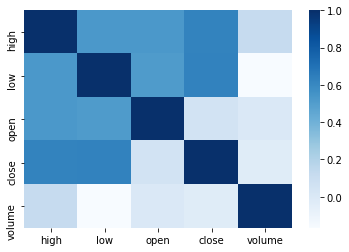

In [8]:
import seaborn as sns

corr = df[['high', 'low', 'open', 'close', 'volume']].diff().dropna().corr()

sns.heatmap(corr,cmap='Blues',annot=False) 

<AxesSubplot:>

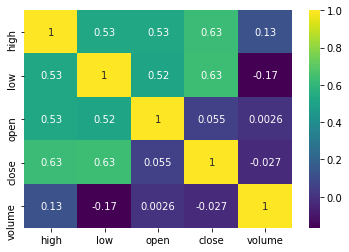

In [9]:
sns.heatmap(corr, annot=True, cmap = 'viridis')

                                             |          | [  0%]   00:00 -> (? left)


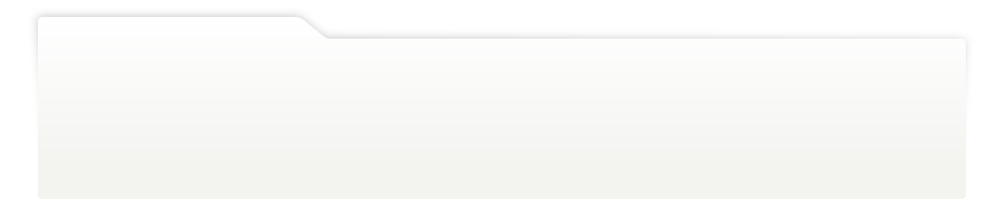
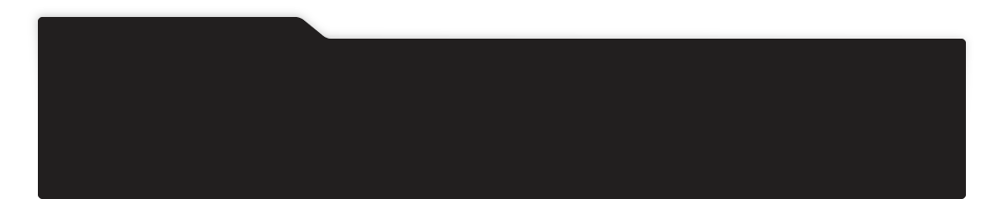
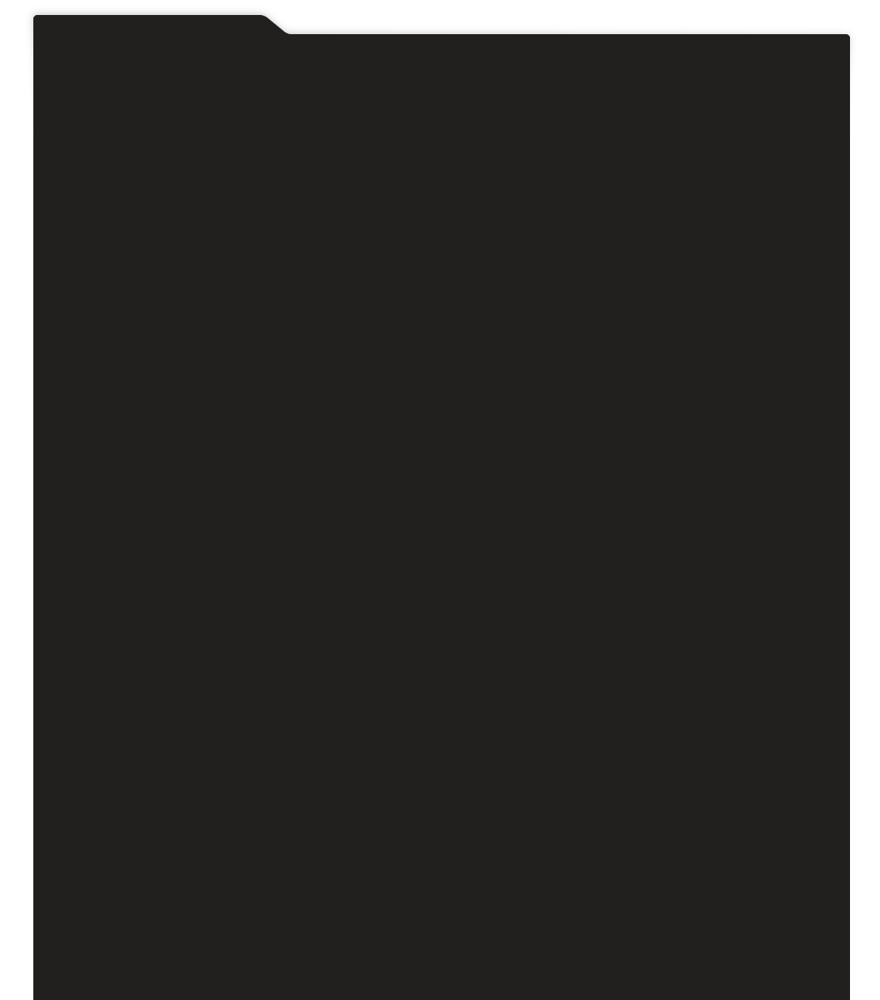
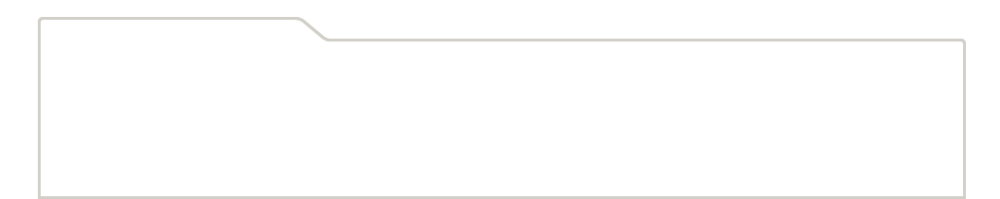
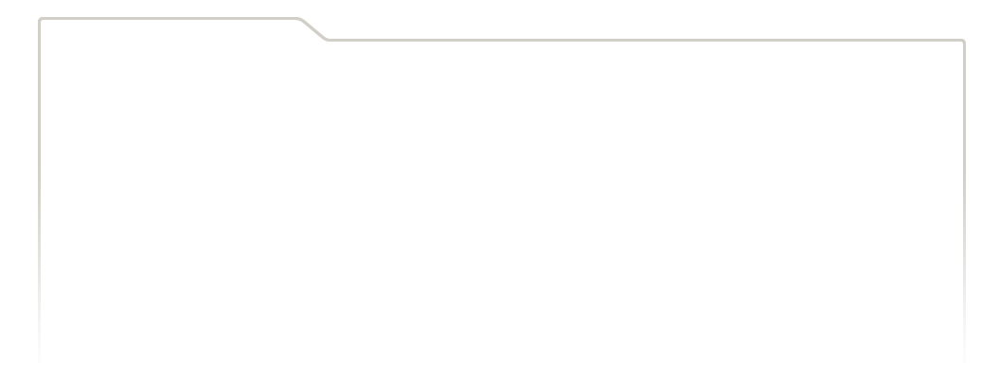
...
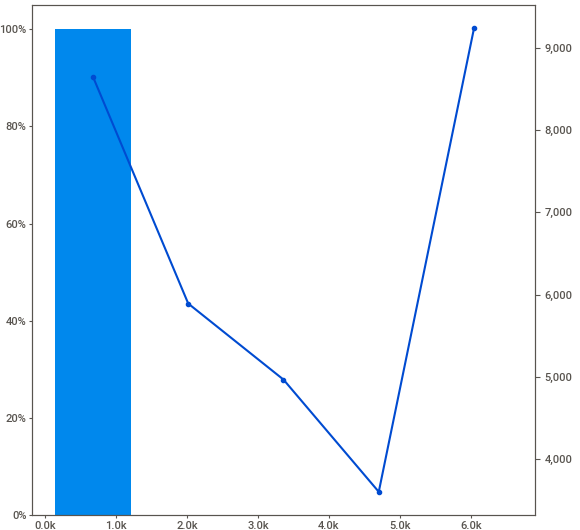
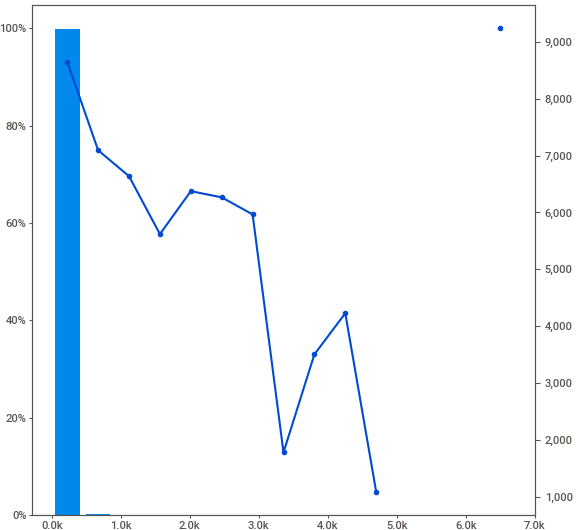
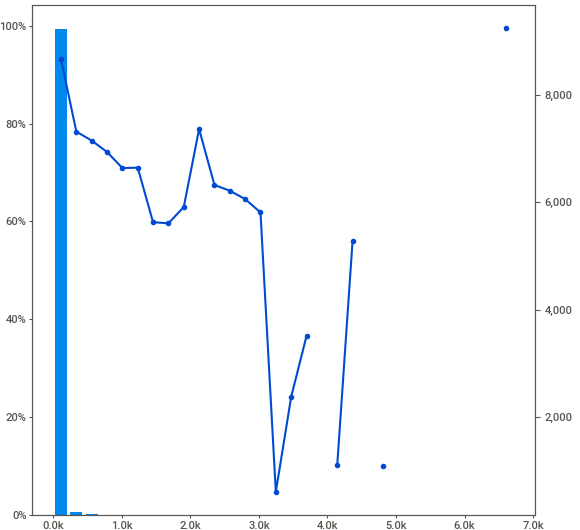
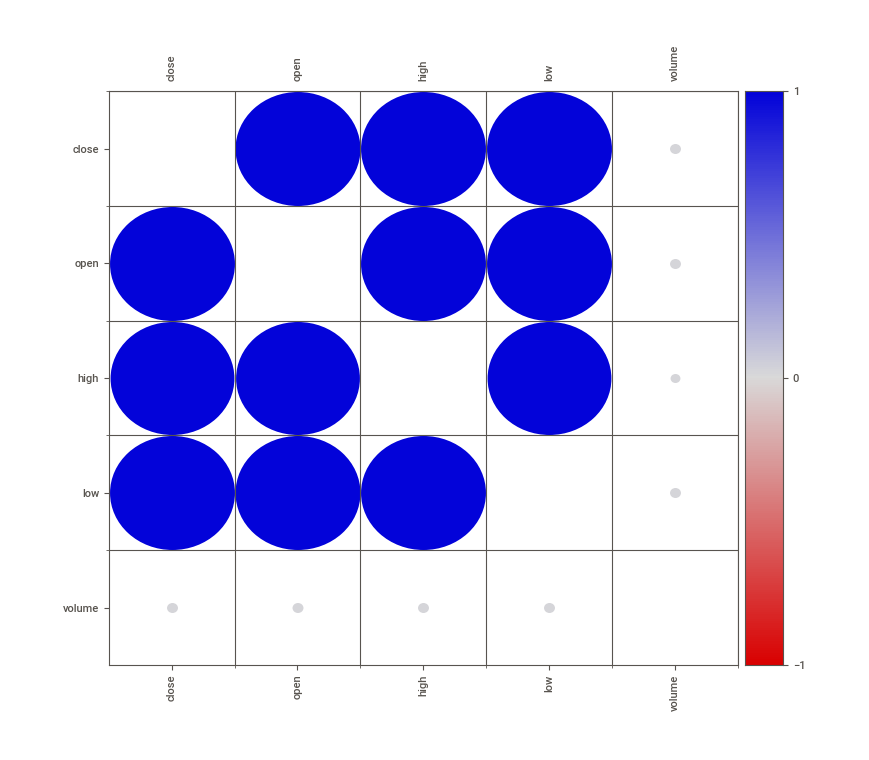
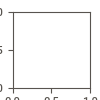

In [13]:
import sweetviz as sv

analyse_report = sv.analyze([df, 'Bitcoin'], target_feat="close")
analyse_report.show_notebook()

### Feature evalution over time

In [14]:
# traget dataset too big for plot

hour_df = df[59:: 60]

hour_df.iplot(
    subplots=True,
)

In [15]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
open,2270370.0,8646.184272,8289.776487,5.631000e+02,3995.000000,7363.400000,9880.000000,58317.000000
high,2270370.0,8651.014196,8296.864962,5.632400e+02,3996.100000,7365.800000,9885.146379,58321.244032
low,2270370.0,8641.305688,8282.576625,5.629900e+02,3993.400000,7361.200000,9875.000000,58304.000000
close,2270370.0,8646.195441,8289.812569,5.630000e+02,3995.000000,7363.300000,9880.000000,58317.000000
volume,2270370.0,15.301625,48.429003,1.000000e-08,0.497497,2.890435,12.214001,6717.516714
